In [1]:
import cv2, os
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
path_csv = "../data/BGR/data_horizons.csv"
path_pictures = "../data/BGR/Profilbilder/"

In [3]:
df = pd.read_csv(path_csv)

image_dataset = os.listdir(path_pictures)
img_files = pd.DataFrame(image_dataset, columns=['file'])
img_files['Point'] = img_files['file'].str.split("_").map(lambda x: x[1]).astype(float)

df = pd.merge(df, img_files, how='inner', on='Point')
df['file'] = df['file'].map(lambda x: os.path.join(path_pictures, x))
df

,Point,HorizontID,Obergrenze,Untergrenze,Horizontsymbol,Bodenart,Bodenfarbe,Steine,Karbonat,Humusgehaltsklasse,Durchwurzelung,Unnamed: 11,Bundesland,PointID,Unnamed: 14,profile,max_depth,file
0,2.0,1.0,0.0,28.0,I; Ap,Sl2,7.5YR 3/2,3.0,C0,h3,Wf4,NaN,SH,2.0,NaN,BB_0541.0,100.0,../data/BGR/Profilbilder/SH_0002_Z_1.jpg
1,2.0,2.0,28.0,54.0,I; E,Sl2,10YR 3/3,3.0,C0,h2,Wf3,NaN,SH,3.0,NaN,BB_0600.0,90.0,../data/BGR/Profilbilder/SH_0002_Z_1.jpg
2,2.0,3.0,54.0,68.0,II; Bv,Sl2,7.5YR 4/3,10.0,C0,h1,Wf3,NaN,SH,4.0,NaN,BB_0601.0,100.0,../data/BGR/Profilbilder/SH_0002_Z_1.jpg
3,2.0,4.0,68.0,96.0,III; Bv-ilCv,fSms,7.5YR 6/4,1.0,C0,h0,Wf2,NaN,SH,5.0,NaN,BB_0659.0,100.0,../data/BGR/Profilbilder/SH_0002_Z_1.jpg
4,2.0,5.0,96.0,201.0,III; ilCv,mSfs,10YR 7/4,1.0,C0,h0,NaN,NaN,SH,6.0,NaN,BB_0660.0,100.0,../data/BGR/Profilbilder/SH_0002_Z_1.jpg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15113,6211.0,3.0,27.0,50.0,I; Bbh+Bs,fSms,5YR 3/2,1.0,C0,h2,Wf3,NaN,NaN,NaN,NaN,NaN,NaN,../data/BGR/Profilbilder/NI_6211_Z_1.jpg
15114,6211.0,4.0,50.0,70.0,I; Bbs+Bs,fSms,5YR 4/3,1.0,C0,h1,Wf2,NaN,NaN,NaN,NaN,NaN,NaN,../data/BGR/Profilbilder/NI_6211_Z_1.jpg
15115,6211.0,5.0,70.0,100.0,I; Go-Bbs,fSms,7.5YR 5/4,1.0,C0,h1,Wf6,NaN,NaN,NaN,NaN,NaN,NaN,../data/BGR/Profilbilder/NI_6211_Z_1.jpg
15116,6211.0,6.0,100.0,130.0,I; Go,fSms,2.5Y 6/4,1.0,C0,h0,Wf4,NaN,NaN,NaN,NaN,NaN,NaN,../data/BGR/Profilbilder/NI_6211_Z_1.jpg


In [4]:
len(image_dataset)

3087

In [5]:
df['file'].value_counts() # why not the same as len(image_dataset)?

file
../data/BGR/Profilbilder/NW_2921_Z_1.jpg    8
../data/BGR/Profilbilder/BB_1190_Z_1.jpg    8
../data/BGR/Profilbilder/NI_6133_Z_1.jpg    8
../data/BGR/Profilbilder/NI_0804_Z_1.jpg    8
../data/BGR/Profilbilder/NI_6136_Z_1.jpg    8
                                           ..
../data/BGR/Profilbilder/BY_3984_Z_1.jpg    2
../data/BGR/Profilbilder/SN_3258_Z_1.jpg    2
../data/BGR/Profilbilder/ST_2053_Z_1.jpg    2
../data/BGR/Profilbilder/SN_3438_Z_1.jpg    2
../data/BGR/Profilbilder/MV_0524_Z_1.jpg    2
Name: count, Length: 3084, dtype: int64

In [6]:
# Profile images only show horizons up to ~1 meter depth
filtered_df = df[df['Obergrenze'] <= 100]

In [7]:
# Number of horizons down to 1 meter will be used as k in KMeans per image
horizon_counts = filtered_df.groupby('file').size()
horizon_counts

file
../data/BGR/Profilbilder/BB_0541_Z_1.jpg    4
../data/BGR/Profilbilder/BB_0600_Z_1.jpg    6
../data/BGR/Profilbilder/BB_0601_Z_1.jpg    4
../data/BGR/Profilbilder/BB_0659_Z_1.jpg    4
../data/BGR/Profilbilder/BB_0660_Z_1.jpg    6
                                           ..
../data/BGR/Profilbilder/TH_3489_Z_1.jpg    4
../data/BGR/Profilbilder/TH_3494_Z_1.jpg    3
../data/BGR/Profilbilder/TH_3496_Z_1.jpg    5
../data/BGR/Profilbilder/TH_3545_Z_1.jpg    4
../data/BGR/Profilbilder/TH_3596_Z_1.jpg    3
Length: 3084, dtype: int64

In [8]:
max(horizon_counts) # most horizons an image can have

8

In [9]:
def center_crop(img_file, x_len, y_len):
    img = cv2.imread(img_file) #Image.open(img_file)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # OpenCV uses BGR format

    center_x, center_y = int(img.shape[0] / 2), int(img.shape[1] / 2)

    left  = center_x - x_len
    right = center_x + x_len
    upper = center_y - y_len
    lower = center_y + y_len

    return img[upper:lower, left:right]

In [10]:
def kmeans_segmentation(image, num_clusters, cluster_colors):
    """Segments an image using K-means clustering and assigns custom colors to clusters.

    Args:
        image: The input image as a NumPy array.
        num_clusters: The desired number of clusters.
        cluster_colors: A list of RGB color tuples for each cluster.

    Returns:
        A segmented image with custom colors applied to each cluster.
    """

    # Reshape the image to a 2D array of pixels
    pixels = image.reshape(-1, 3)

    # Perform K-means clustering
    kmeans = KMeans(n_clusters=num_clusters, random_state=0)
    kmeans.fit(pixels)

    # Assign cluster labels to each pixel
    labels = kmeans.labels_

    # Create a colormap based on the specified cluster colors
    colormap = np.array(cluster_colors)[labels]

    # Reshape the colormap to match the original image shape
    segmented_image = colormap.reshape(image.shape)

    return segmented_image

### Kmeans on original images

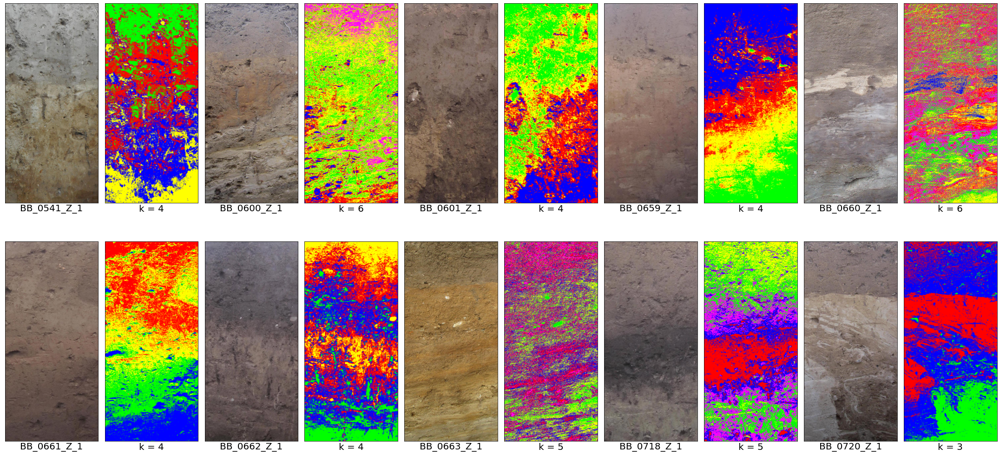

In [59]:
x_len, y_len = 280, 600
cluster_colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0),
                  (255, 0, 255), (255, 255, 0), (255, 128, 0), (128, 0, 255)]
max_imgs = 10

plt.figure(figsize=(3*max_imgs, 15))
for i, (file, k) in enumerate(horizon_counts.items()):
    if i == max_imgs: break
    cropped_img = center_crop(file, x_len, y_len)

    segmented_img = kmeans_segmentation(cropped_img, k, cluster_colors)

    plt.subplot(2, max_imgs, 2*i+1)
    plt.imshow(cropped_img)
    plt.xlabel(file.split('/')[-1][:-4], fontsize=20)
    plt.xticks([], []); plt.yticks([], [])
    plt.subplot(2, max_imgs, 2*i+2)
    plt.imshow(segmented_img)
    plt.xlabel(f'k = {k}', fontsize=20)
    plt.xticks([], []); plt.yticks([], [])
plt.tight_layout()
plt.show()

### Kmeans on contrast-enhanced images

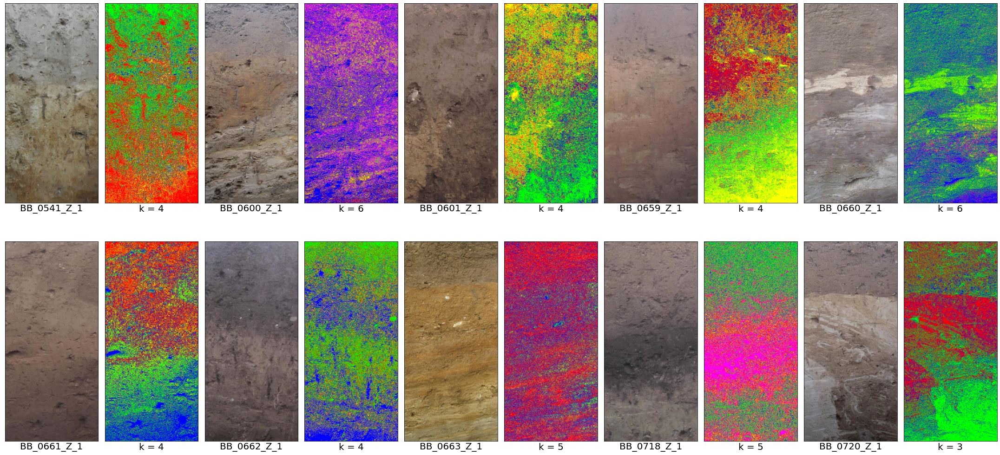

In [11]:
x_len, y_len = 280, 600
cluster_colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0),
                  (255, 0, 255), (255, 255, 0), (255, 128, 0), (128, 0, 255)]
unsharp_kernel = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
max_imgs = 10

plt.figure(figsize=(3*max_imgs, 15))
for i, (file, k) in enumerate(horizon_counts.items()):
    if i == max_imgs: break
    cropped_img = center_crop(file, x_len, y_len)

    ### Image enhancement
    # Convert to HSV color space
    hsv = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2HSV)
    # Equalize the Value channel
    hsv[:, :, 2] = cv2.equalizeHist(hsv[:, :, 2])
    # Convert back to BGR
    img_equal = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    # Apply unsharp masking for further contrast enhancement
    img_contrast = cv2.filter2D(img_equal, -1, unsharp_kernel)

    segmented_img = kmeans_segmentation(img_contrast, k, cluster_colors)

    plt.subplot(2, max_imgs, 2*i+1)
    plt.imshow(cropped_img)
    plt.xlabel(file.split('/')[-1][:-4], fontsize=20)
    plt.xticks([], []); plt.yticks([], [])
    plt.subplot(2, max_imgs, 2*i+2)
    plt.imshow(segmented_img)
    plt.xlabel(f'k = {k}', fontsize=20)
    plt.xticks([], []); plt.yticks([], [])
plt.tight_layout()
plt.show()

### Kmeans on Gauss-blurred images

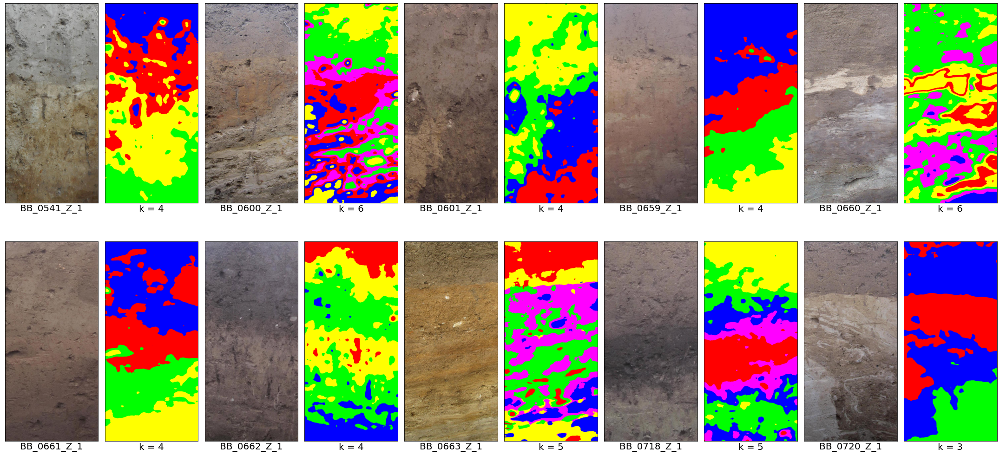

In [16]:
x_len, y_len = 280, 600
cluster_colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0),
                  (255, 0, 255), (255, 255, 0), (255, 128, 0), (128, 0, 255)]
max_imgs = 10

plt.figure(figsize=(3*max_imgs, 15))
for i, (file, k) in enumerate(horizon_counts.items()):
    if i == max_imgs: break
    cropped_img = center_crop(file, x_len, y_len)
    img_blur = cv2.GaussianBlur(cropped_img, (33,33), 20)

    segmented_img = kmeans_segmentation(img_blur, k, cluster_colors)

    plt.subplot(2, max_imgs, 2*i+1)
    plt.imshow(cropped_img)
    plt.xlabel(file.split('/')[-1][:-4], fontsize=20)
    plt.xticks([], []); plt.yticks([], [])
    plt.subplot(2, max_imgs, 2*i+2)
    plt.imshow(segmented_img)
    plt.xlabel(f'k = {k}', fontsize=20)
    plt.xticks([], []); plt.yticks([], [])
plt.tight_layout()
plt.show()

### Kmeans with Bilateral Filter

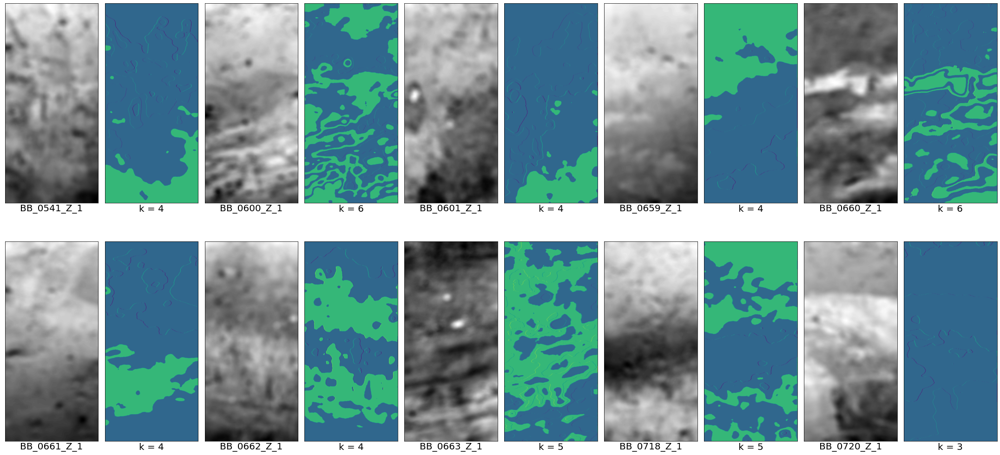

In [28]:
x_len, y_len = 280, 600
cluster_colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0),
                  (255, 0, 255), (255, 255, 0), (255, 128, 0), (128, 0, 255)]
max_imgs = 10

plt.figure(figsize=(3*max_imgs, 15))
for i, (file, k) in enumerate(horizon_counts.items()):
    if i == max_imgs: break
    cropped_img = center_crop(file, x_len, y_len)

    img_gray = cv2.cvtColor(cropped_img, cv2.COLOR_BGR2GRAY)
    img_blur = cv2.bilateralFilter(img_gray, d = 50, sigmaColor = 1000, sigmaSpace = 20)

    segmented_img = kmeans_segmentation(img_blur, k, cluster_colors)

    plt.subplot(2, max_imgs, 2*i+1)
    plt.imshow(img_blur, cmap='gray')
    plt.xlabel(file.split('/')[-1][:-4], fontsize=20)
    plt.xticks([], []); plt.yticks([], [])
    plt.subplot(2, max_imgs, 2*i+2)
    plt.imshow(segmented_img)
    plt.xlabel(f'k = {k}', fontsize=20)
    plt.xticks([], []); plt.yticks([], [])
plt.tight_layout()
plt.show()

### Kmeans closing

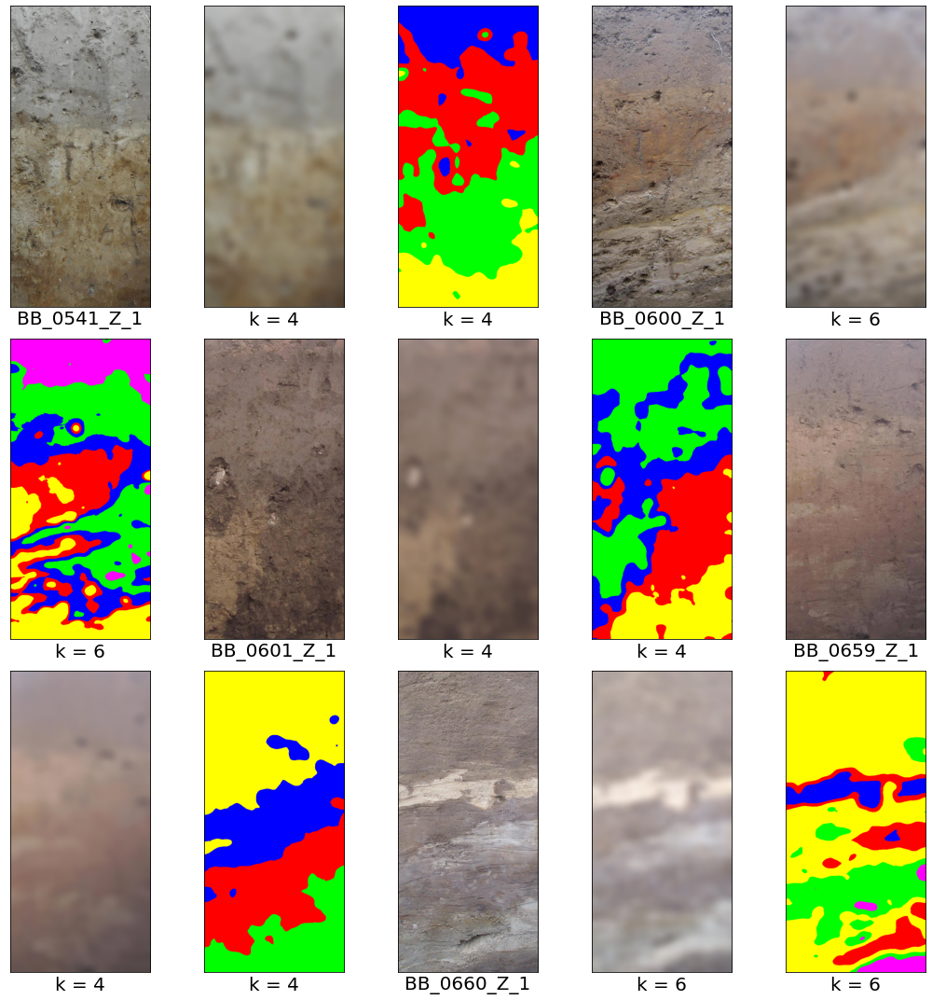

In [24]:
x_len, y_len = 280, 600
cluster_colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0),
                  (255, 0, 255), (255, 255, 0), (255, 128, 0), (128, 0, 255)]
max_imgs = 5

plt.figure(figsize=(3*max_imgs, 15))
for i, (file, k) in enumerate(horizon_counts.items()):
    if i == max_imgs: break
    cropped_img = center_crop(file, x_len, y_len)

    kernel = np.ones((10,10),np.uint8)
    img_closed = cv2.morphologyEx(cropped_img, cv2.MORPH_CLOSE, kernel)

    img_blur = cv2.bilateralFilter(img_closed, d = 50, sigmaColor = 1000, sigmaSpace = 20)

    segmented_img = kmeans_segmentation(img_blur, k, cluster_colors)

    plt.subplot(3, max_imgs, 3*i+1)
    plt.imshow(cropped_img)
    plt.xlabel(file.split('/')[-1][:-4], fontsize=20)
    plt.xticks([], []); plt.yticks([], [])

    plt.subplot(3, max_imgs, 3*i+2)
    plt.imshow(img_blur)
    plt.xlabel(f'k = {k}', fontsize=20)
    plt.xticks([], []); plt.yticks([], [])

    plt.subplot(3, max_imgs, 3*i+3)
    plt.imshow(segmented_img)
    plt.xlabel(f'k = {k}', fontsize=20)
    plt.xticks([], []); plt.yticks([], [])
plt.tight_layout()
plt.show()

In [ ]:
"""TODO
1. Smoothen and increase contrast in images before kmeans
2. Initialize centroids according to depth info
"""

In [19]:
# Load one image
img_name = "image10"
image = cv2.imread(f"../data/BGR/images/{img_name}.png")

# Specify the number of clusters
num_clusters = 3  # 1:2, 2:3, 10:2
cluster_colors = [(255, 0, 0), (0, 255, 0), (0, 0, 255), (255, 255, 0), (255, 0, 255)]

# Perform K-means segmentation
segmented_image = kmeans_segmentation(image, num_clusters, cluster_colors)

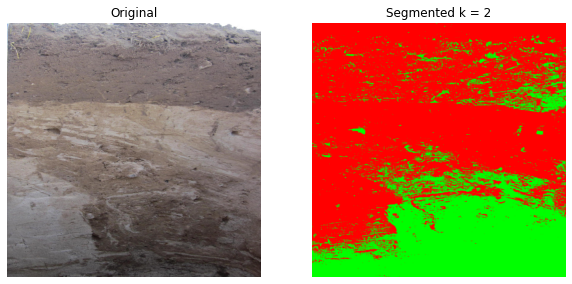

In [18]:
plt.figure(figsize=(10, 8))
plt.subplot(121)
plt.title('Original')
plt.imshow(image)
plt.axis('off')
plt.subplot(122)
plt.title('Segmented k = ' + str(num_clusters))
plt.imshow(segmented_image)
plt.axis('off')
plt.show()

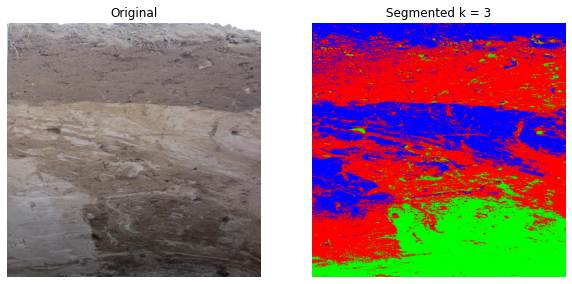

In [20]:
plt.figure(figsize=(10, 8))
plt.subplot(121)
plt.title('Original')
plt.imshow(image)
plt.axis('off')
plt.subplot(122)
plt.title('Segmented k = ' + str(num_clusters))
plt.imshow(segmented_image)
plt.axis('off')
plt.show()